# **IMPORTING LIBRARIES AND MOUNTING DRIVE**

In [4]:
from google.colab import drive
import glob
import numpy as np
import os
from google.colab import drive
from PIL import Image
from scipy import signal
import cv2
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **READING IMAGES**

In [20]:
image = cv2.imread('/content/drive/MyDrive/Hackathon_emotions/Handsome_me.png') 

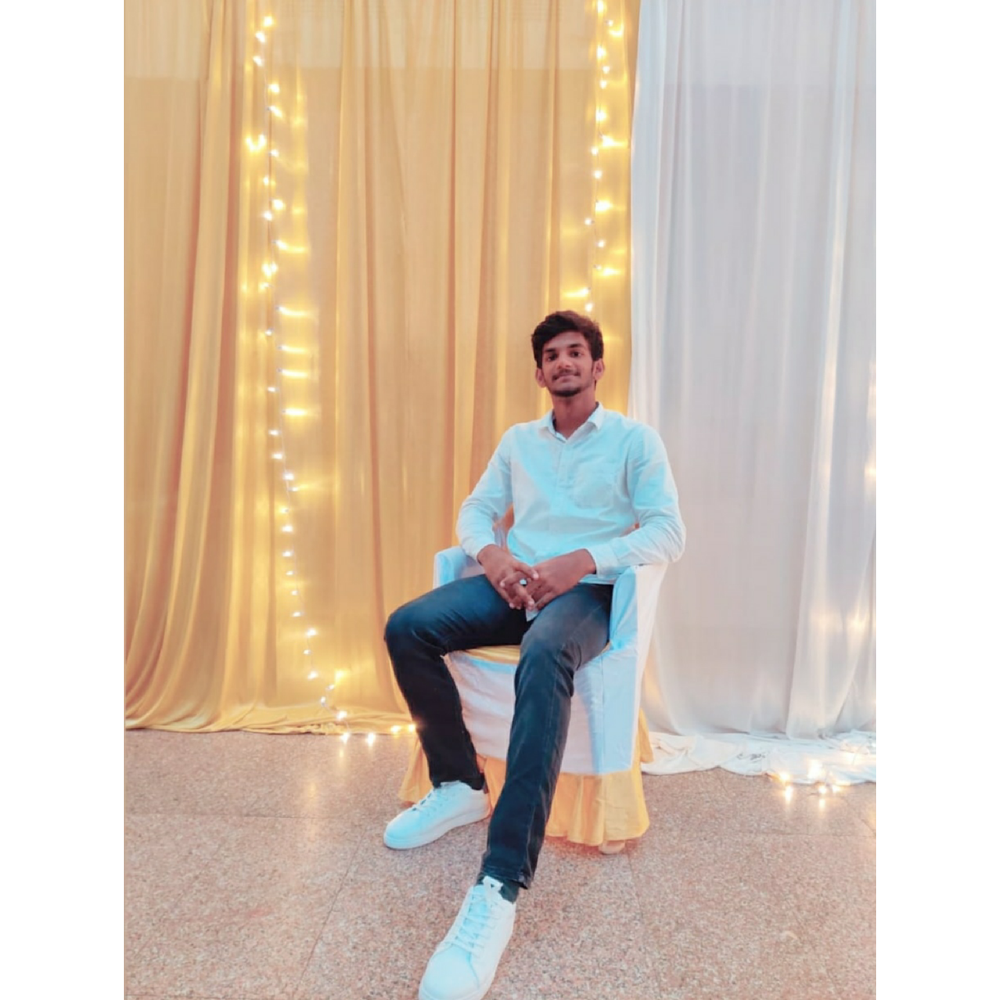

In [95]:
cv2_imshow(image)

# **TOPOLOGICAL OPERATIONS**

## **M-adjacency**

Two pixels p and q with values from V are m-adjacent if

1) q is in N4(p), or

2) q is in ND(p) and the set N4(p)∩N4(q) has no pixels whose values are from V.

### **Connectivity between pixels**

It is an important concept in digital image processing.It is used for establishing boundaries of objects and components of regions in an image.

**Two pixels are said to be connected:**

if they are adjacent in some sense(neighbour pixels,4/8/m-adjacency)

if their gray levels satisfy a specified criterion of similarity(equal intensity level)

There are three types of connectivity on the basis of adjacency. They are:

a) **4-connectivity:** Two or more pixels are said to be 4-connected if they are 4-adjacent with each others.

b) **8-connectivity:** Two or more pixels are said to be 8-connected if they are 8-adjacent with each others.

c) **m-connectivity:** Two or more pixels are said to be m-connected if they are m-adjacent with each others.

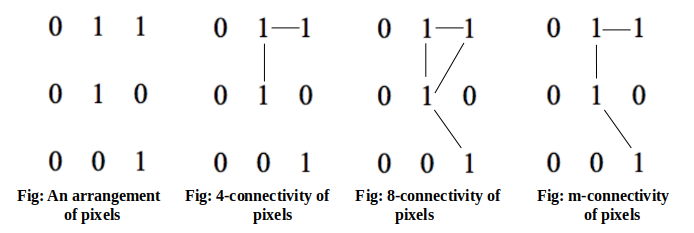

# **POINT OPERATIONS**

## **Image negatives**

In [96]:
# Subtract each intensity from max to obtain negative
negative = 255 - image

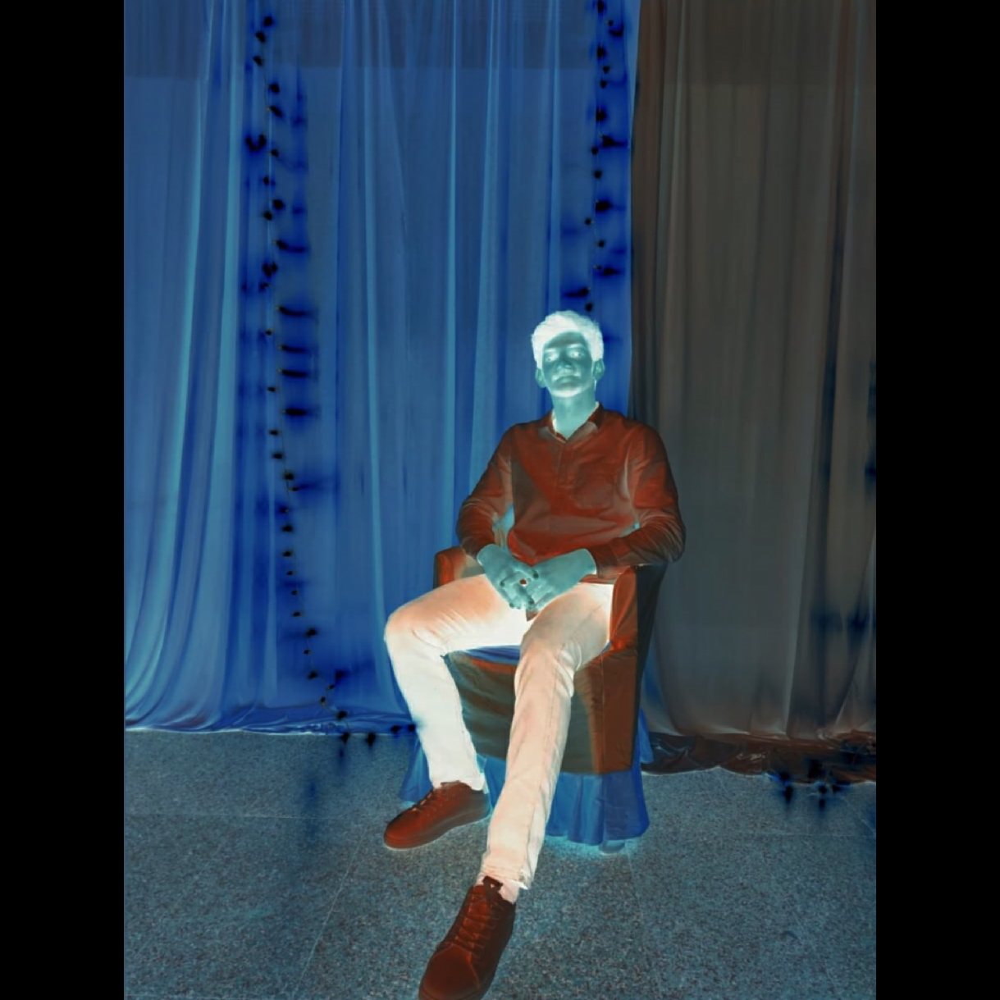

In [97]:
cv2_imshow(negative)

## **Power log transformation**

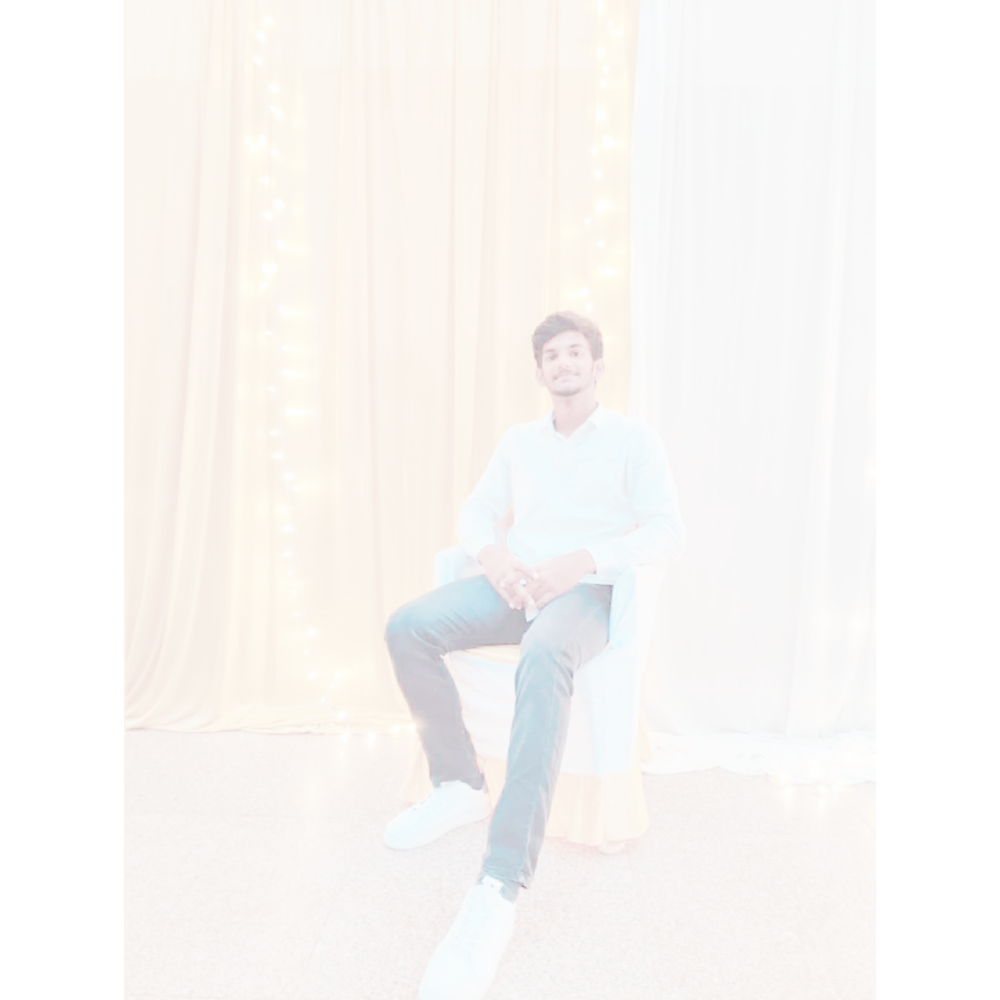

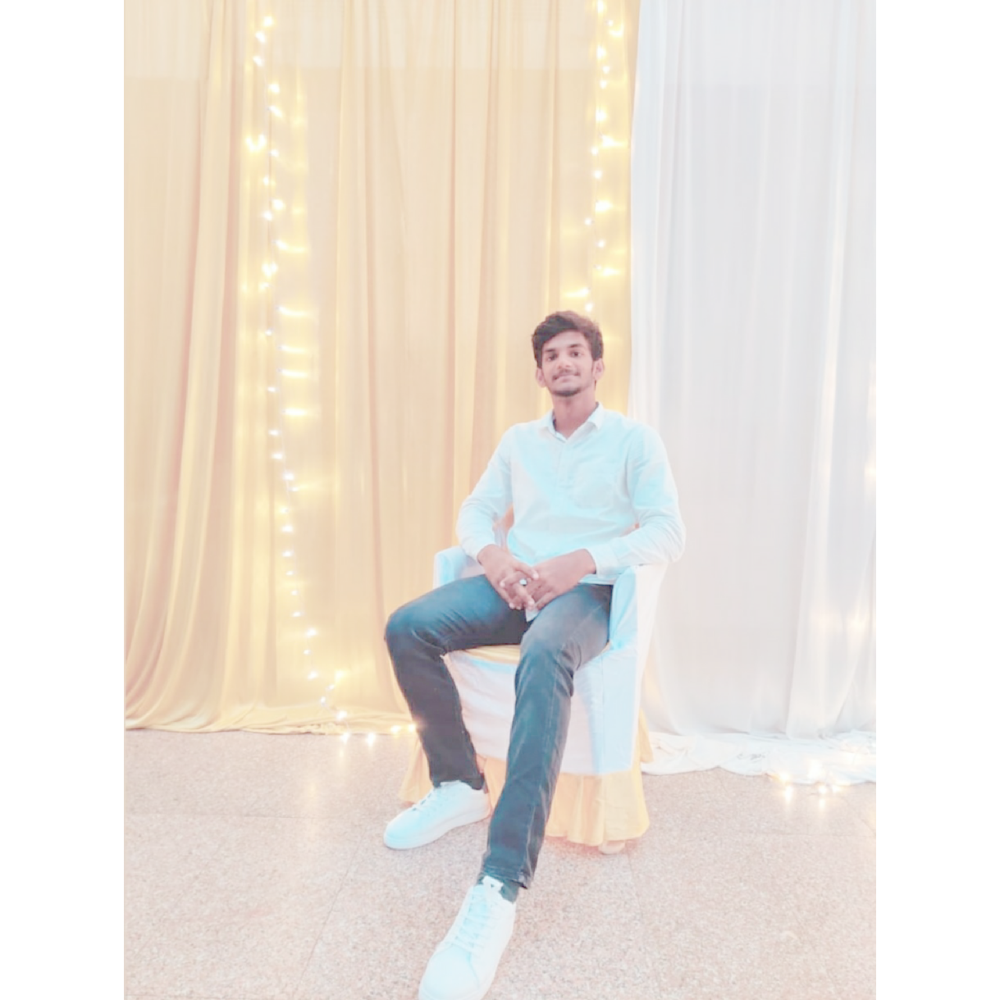

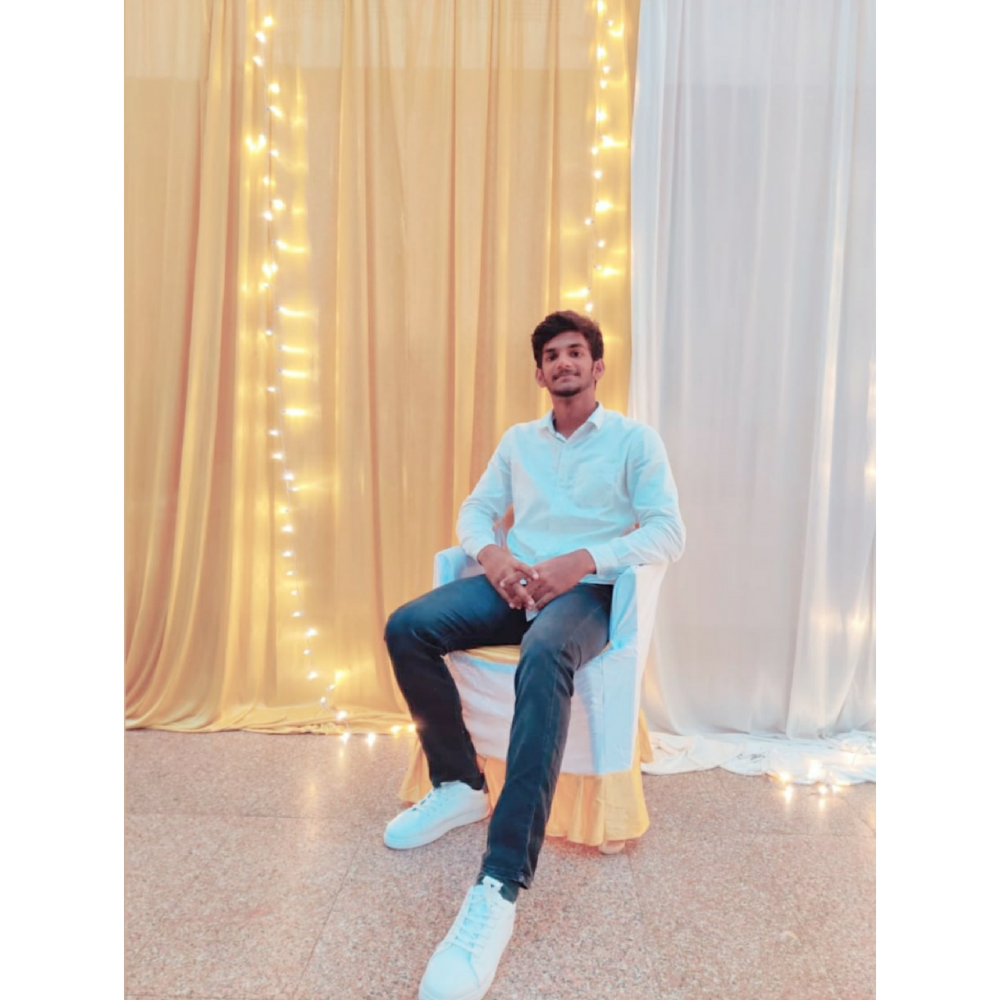

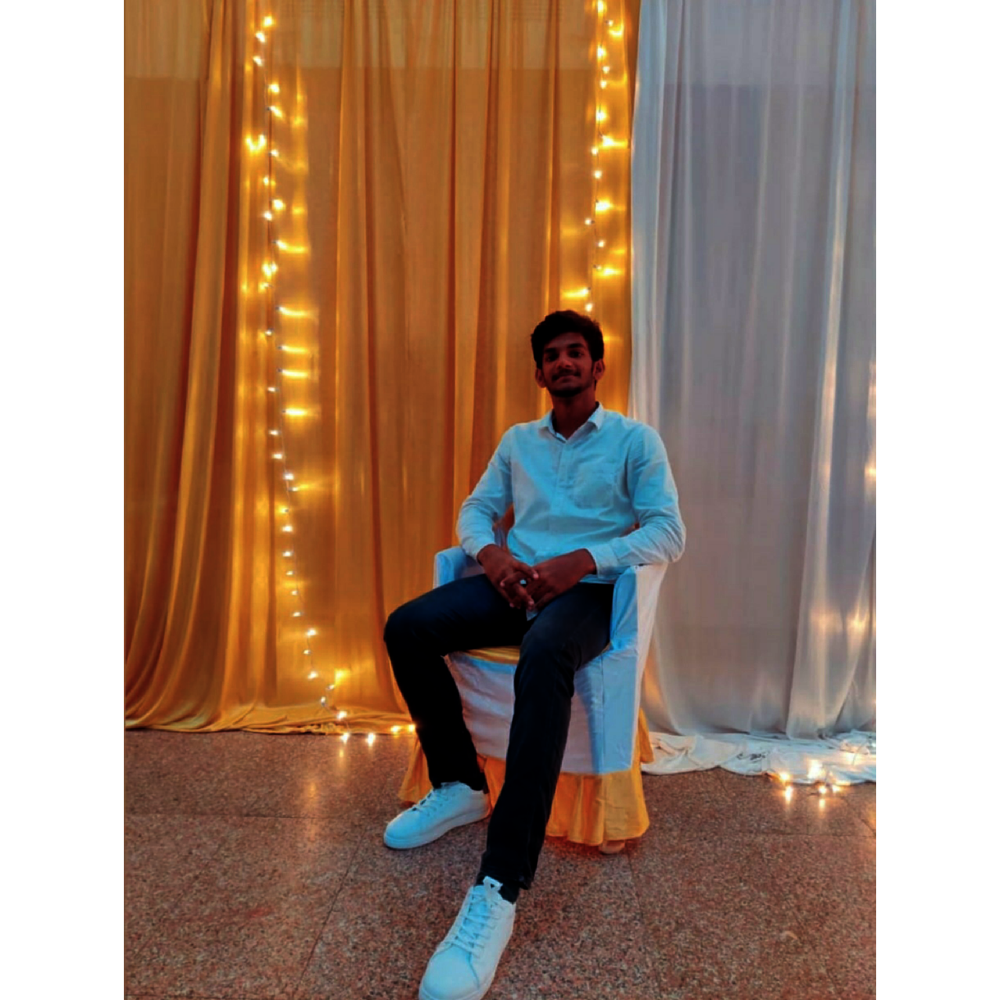

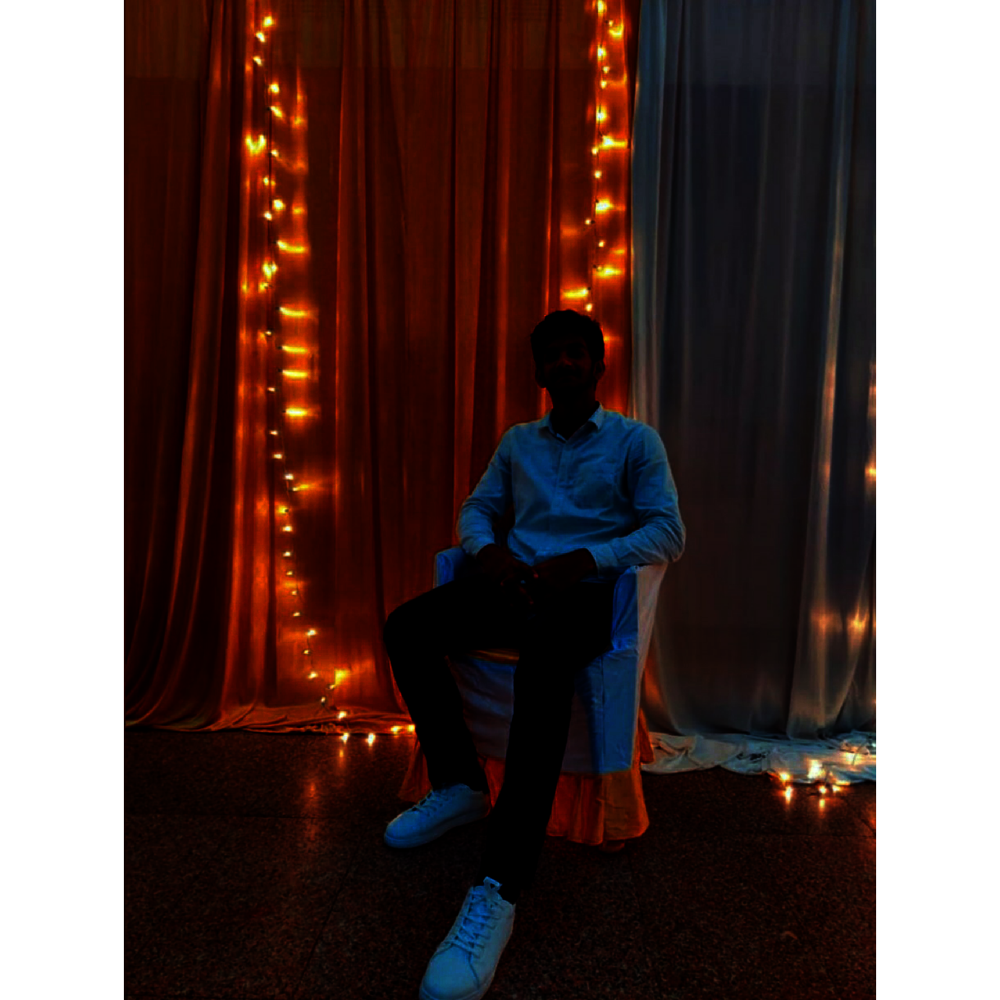

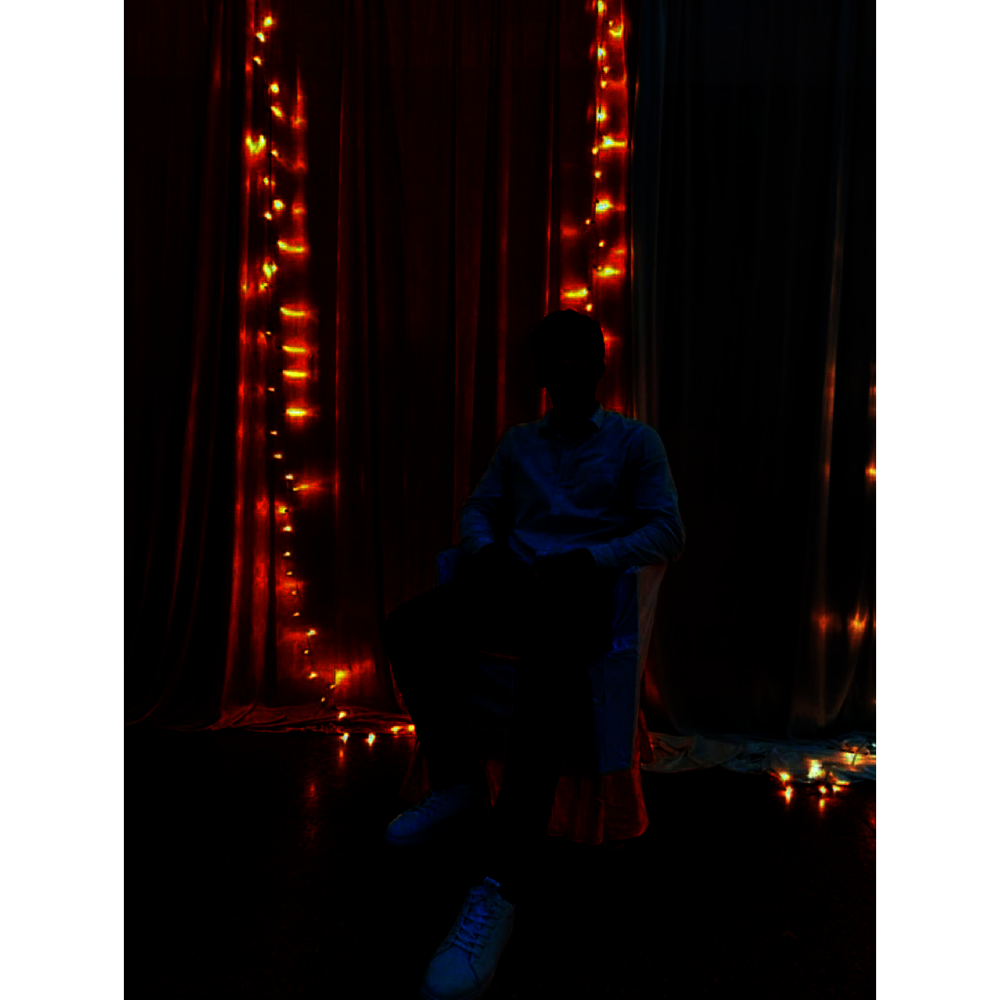

In [100]:
for k in [0.1,0.4,0.9,3,10,20]:
  power_log = np.array(255*(image/255)**k, dtype = 'uint8')
  cv2_imshow(power_log)

## **Piece-wise-Linear Transformation Functions**

In [21]:
r, g, b = image[:,:,0], image[:,:,1], image[:,:,2]
gray = 0.2989 * r + 0.5870 * g + 0.1140 * b

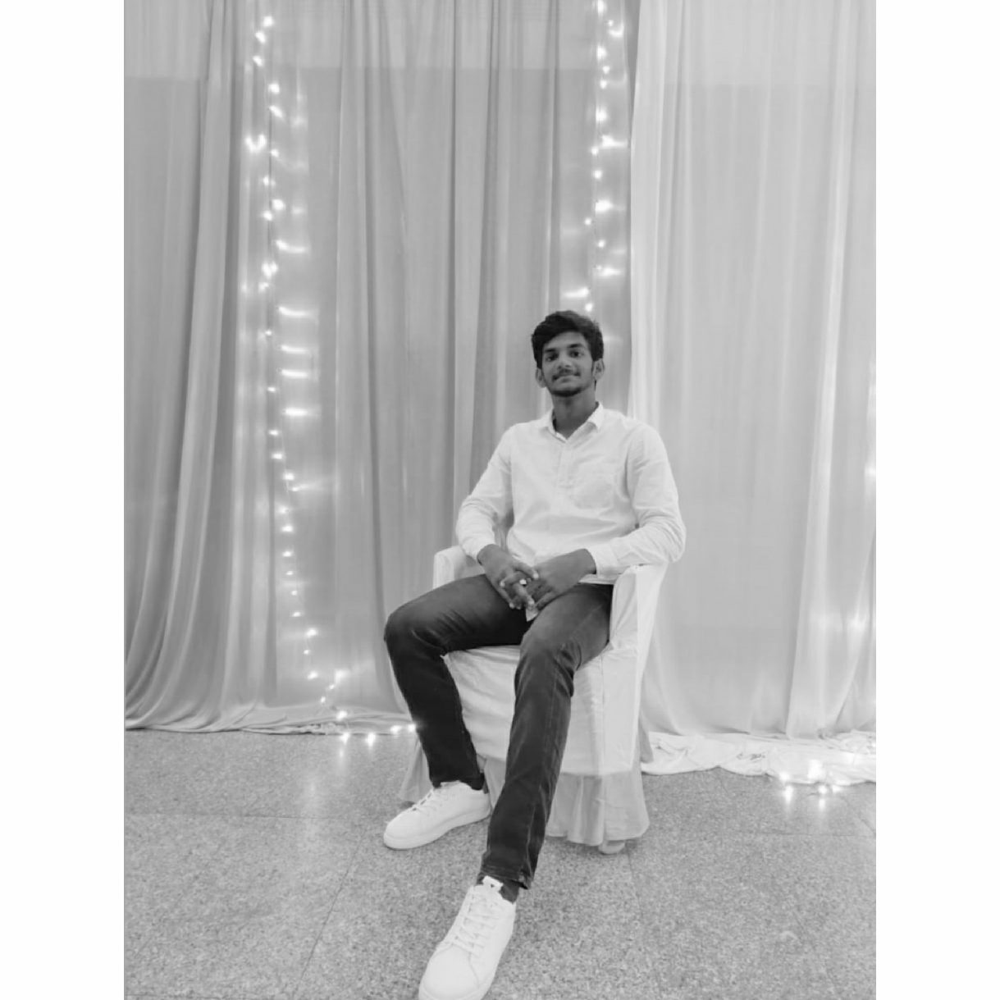

In [146]:
cv2_imshow(gray)

### **Threshold transformations**

In [102]:
imgarray = np.array((gray/255), dtype = 'float64')

In [103]:
print(imgarray[0][0])

0.9998999999999999


In [104]:
imgarray.shape

(1219, 1219)

In [105]:
img = np.zeros((1219, 1219))

In [122]:
for i in range(1219):
  for j in range(1219):
    if imgarray[i][j]<=0.6:
      img[i][j] = 0
    else:
      img[i][j] = 255


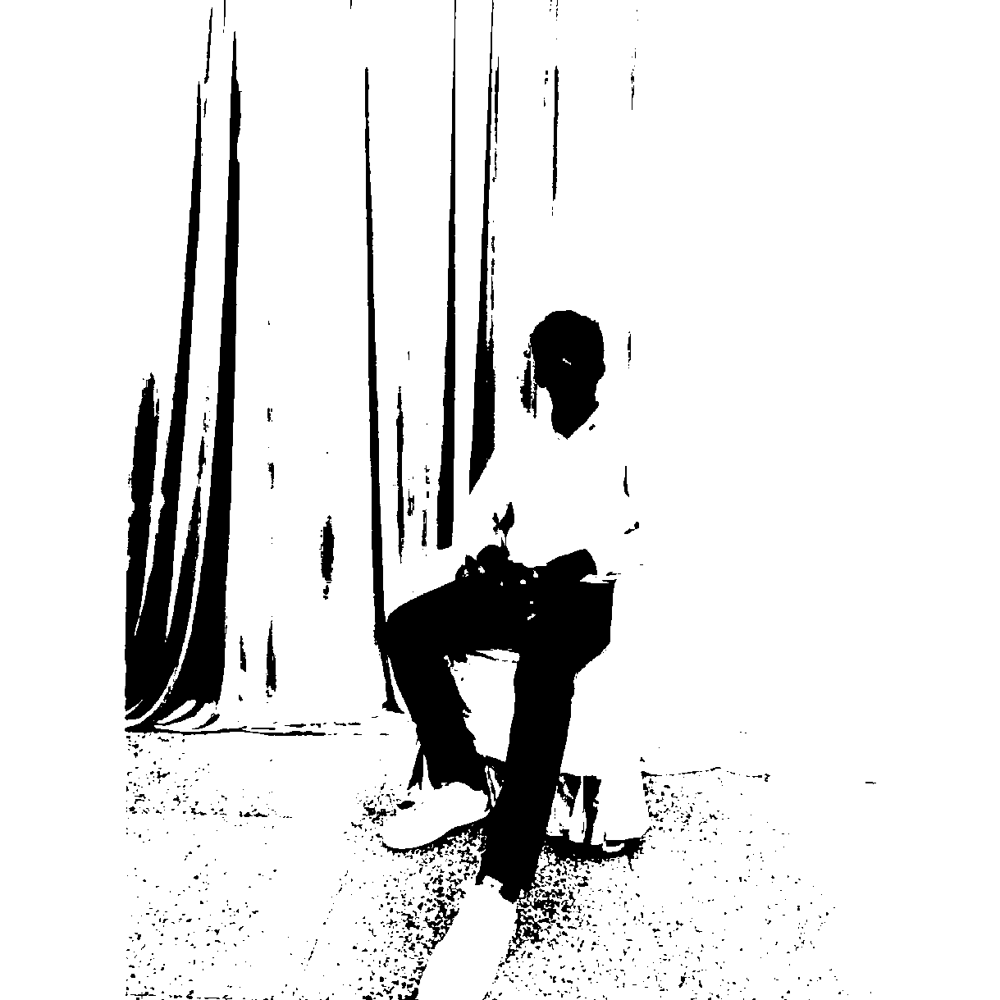

In [123]:
cv2_imshow(img)

### **Bit plane scaling**

In [163]:
grayy = np.array(gray, dtype='uint8')

In [168]:
grayy.shape

(1219, 1219)

In [178]:
result = np.zeros([1219, 1219])
resultt = np.zeros([1219, 1219])

In [218]:
print(result[600][340])

10101010.0


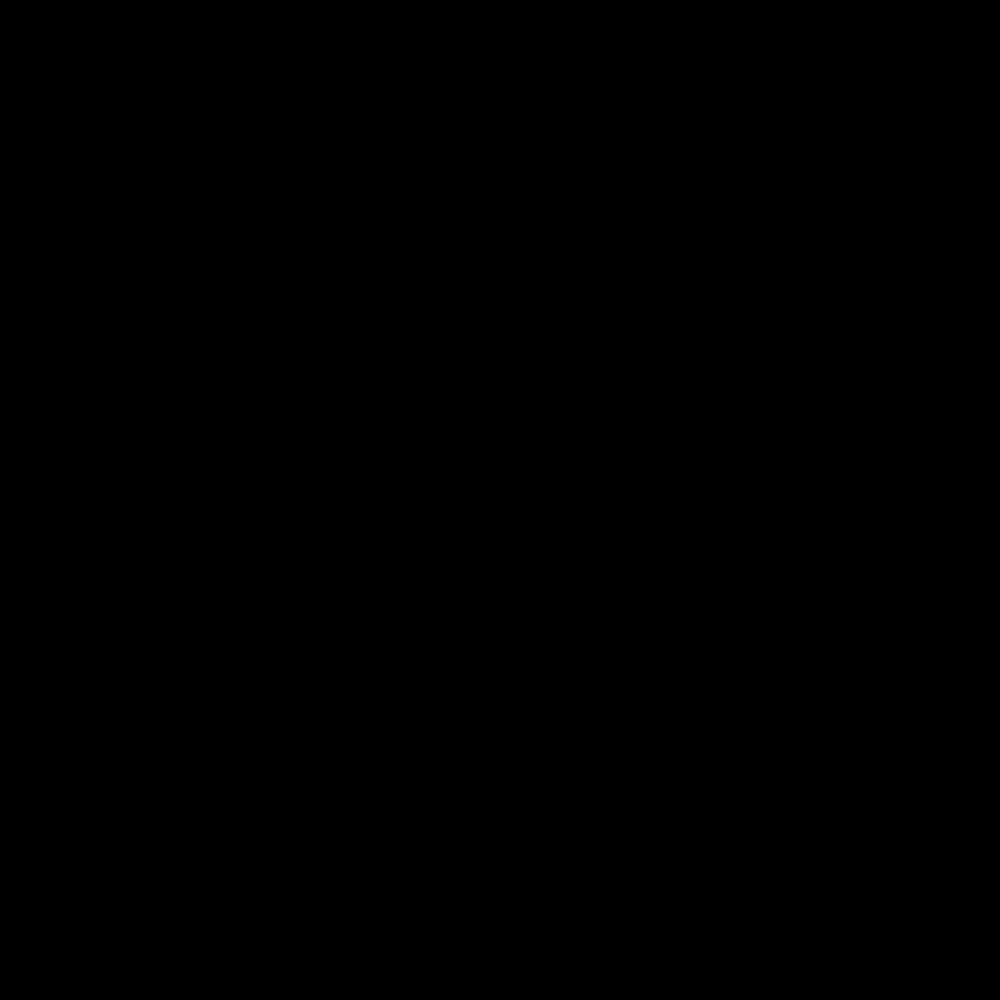

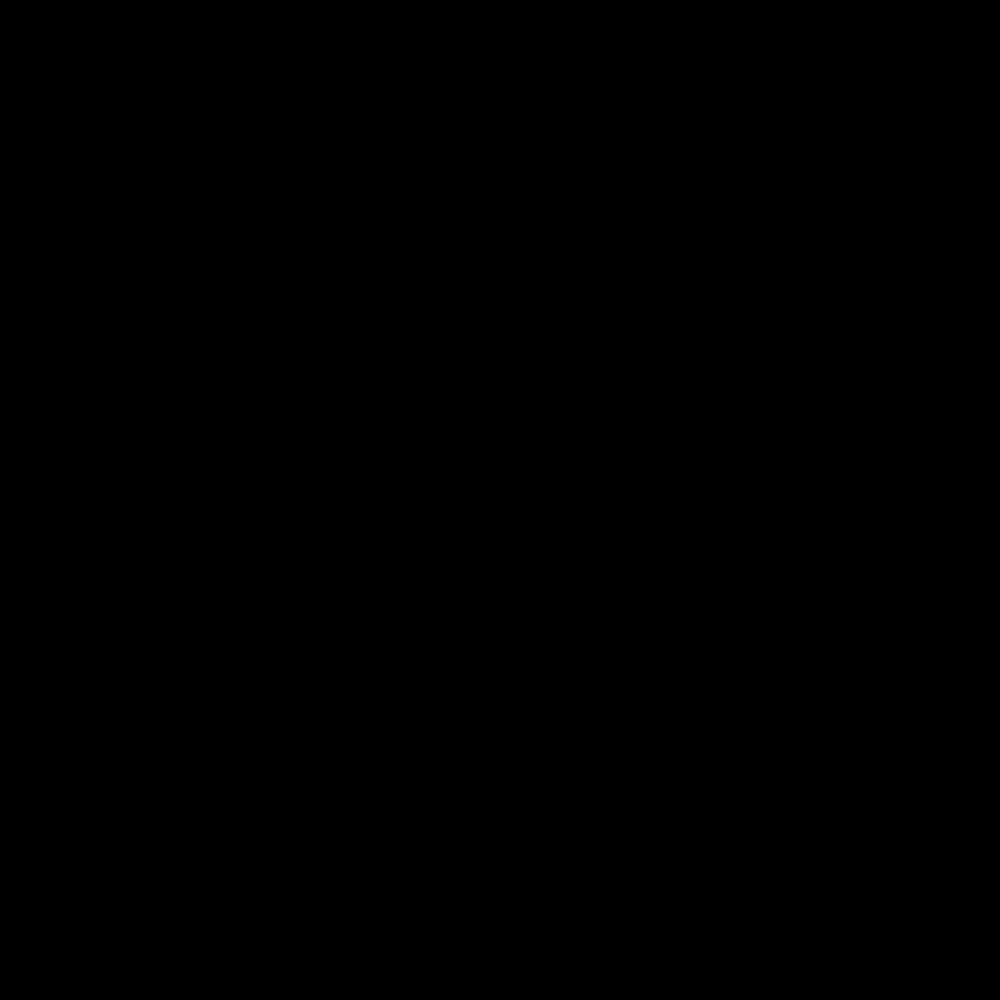

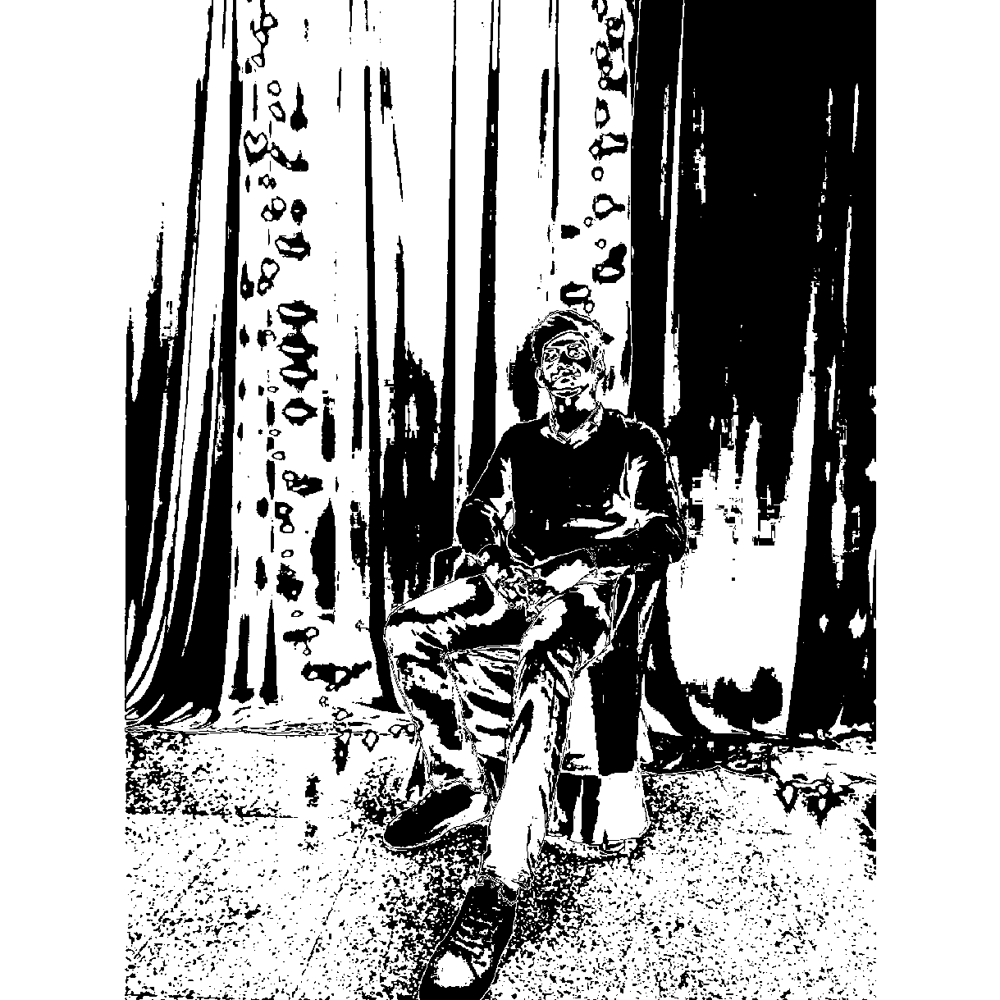

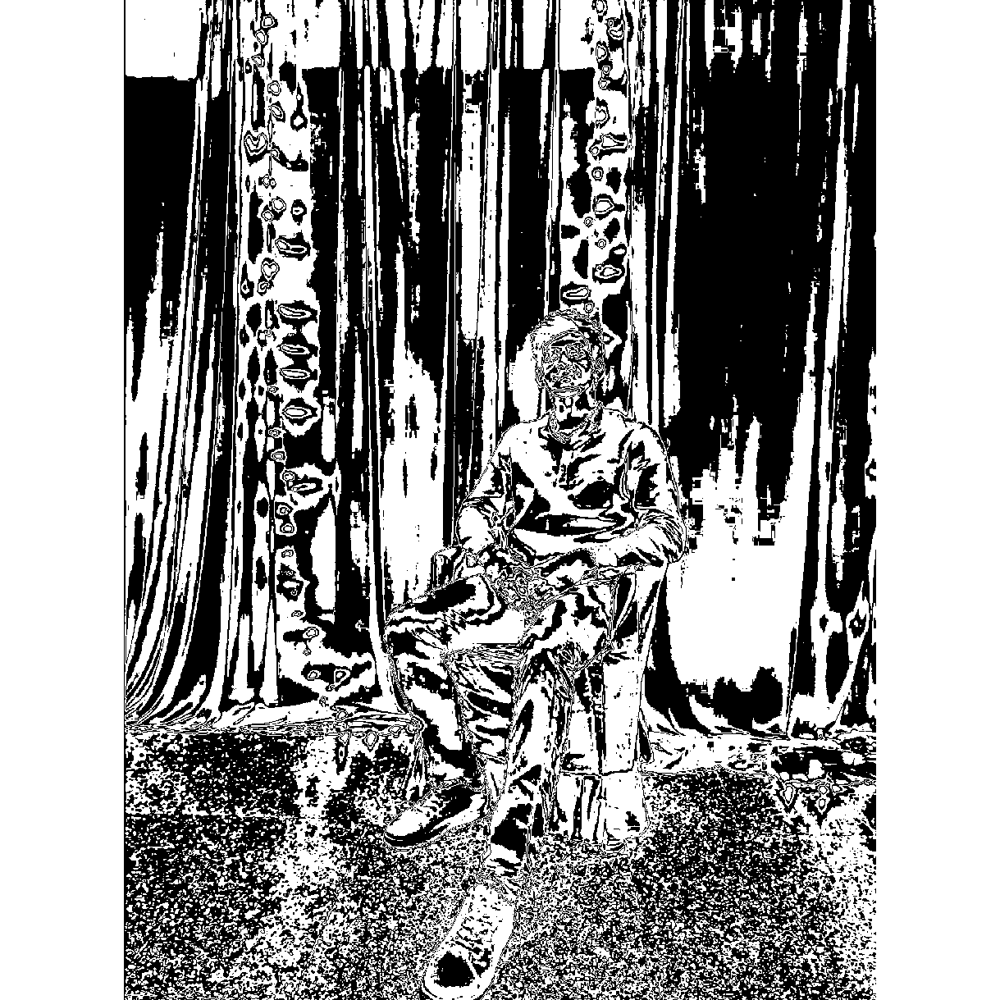

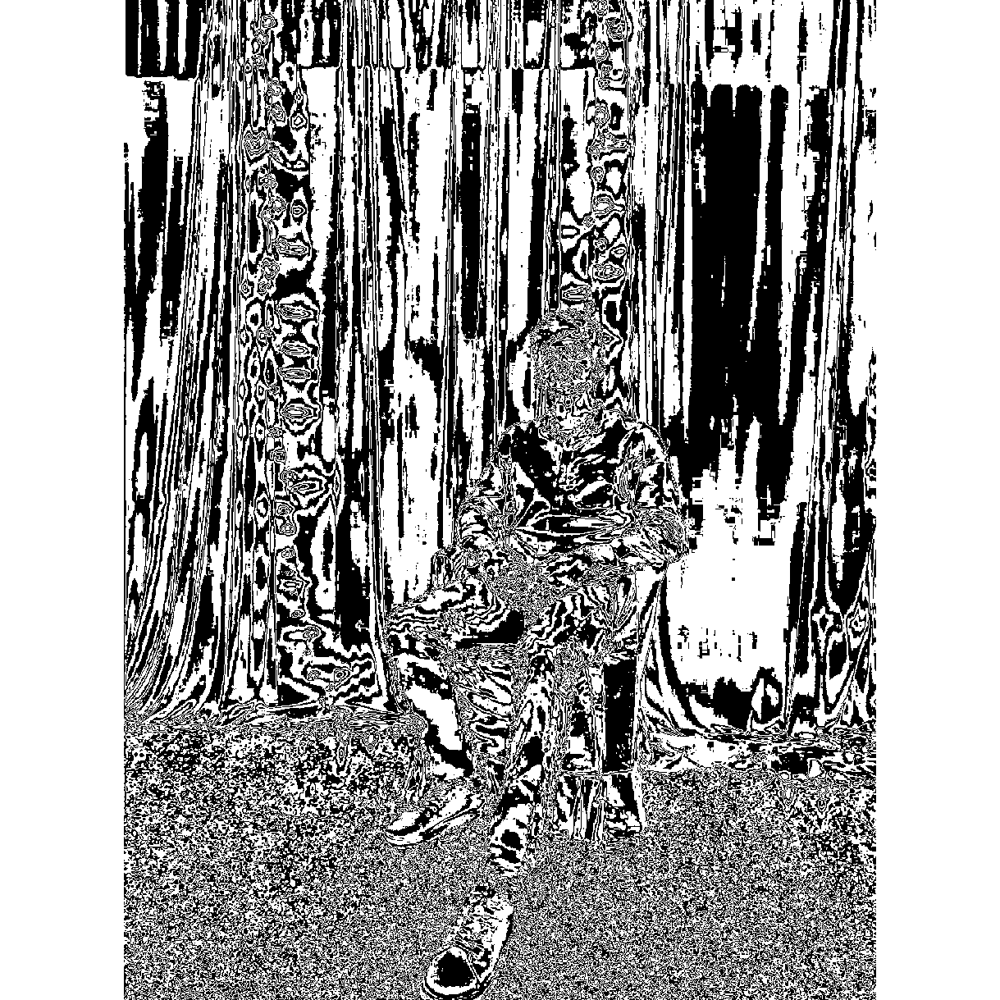

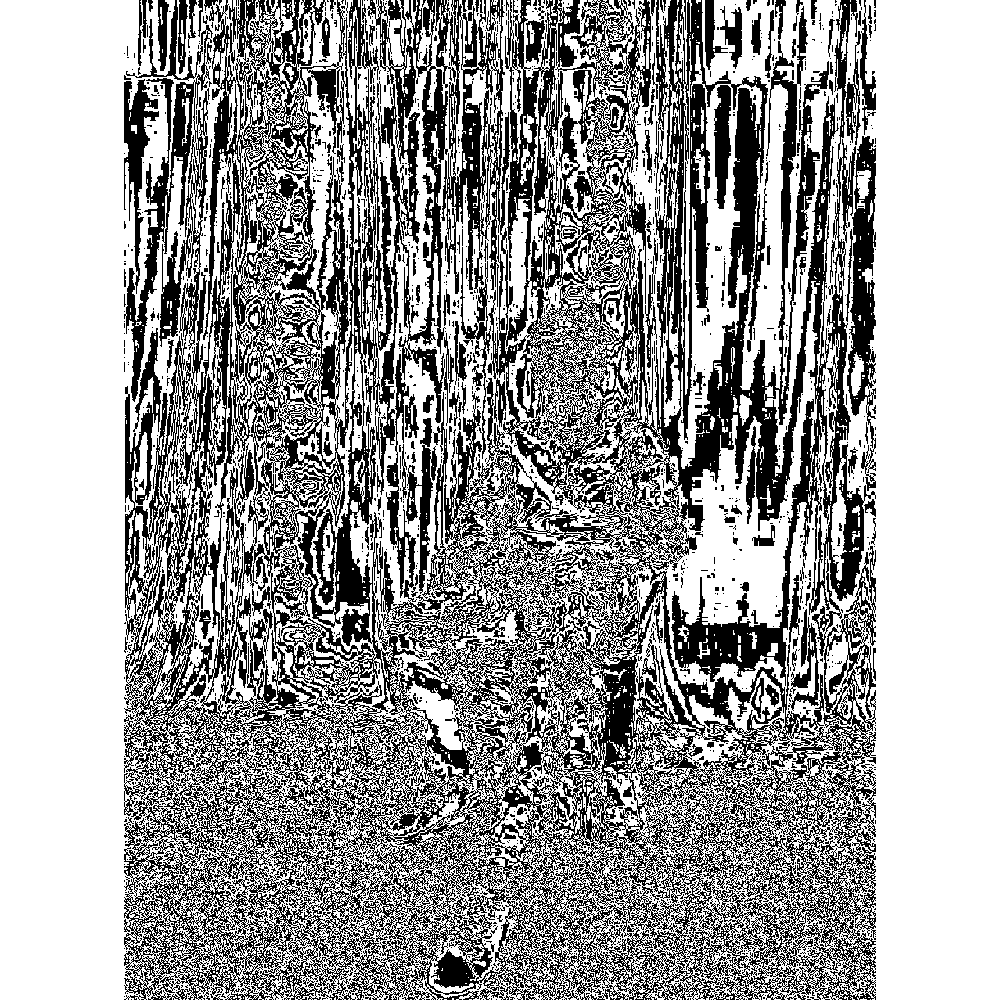

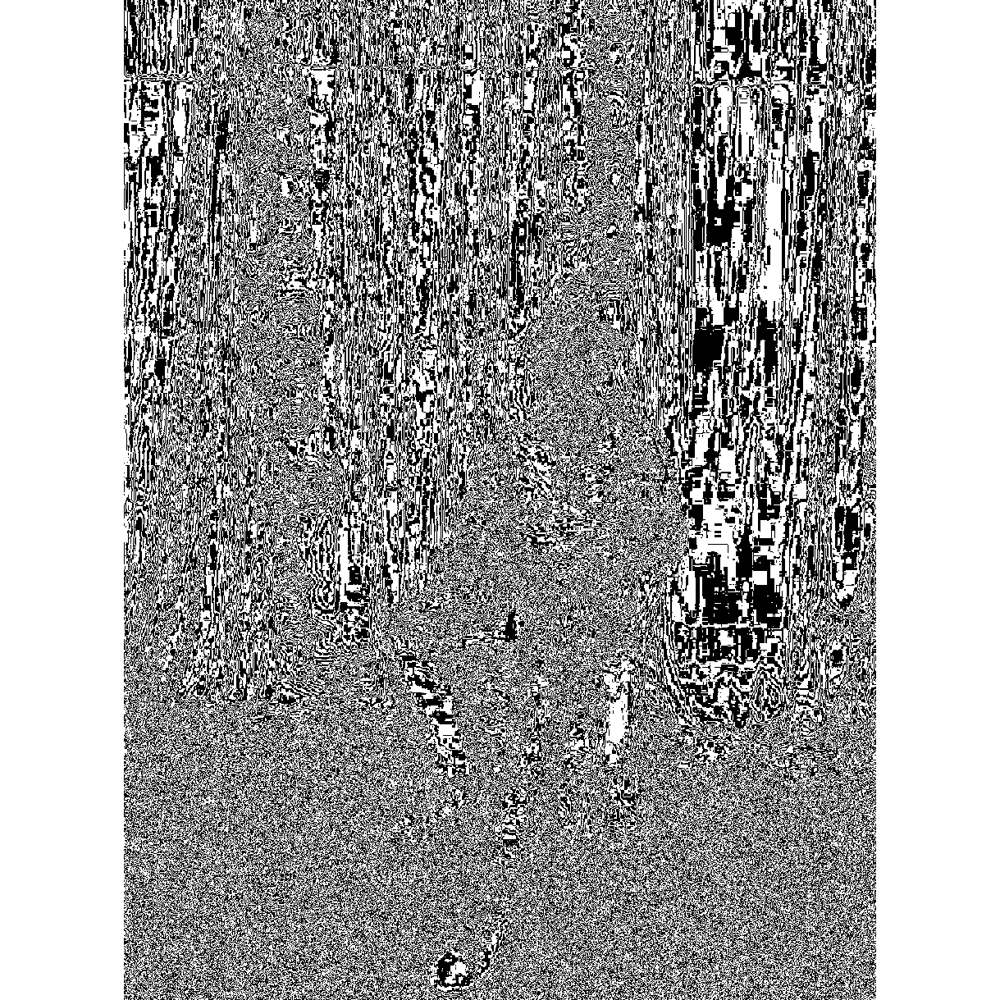

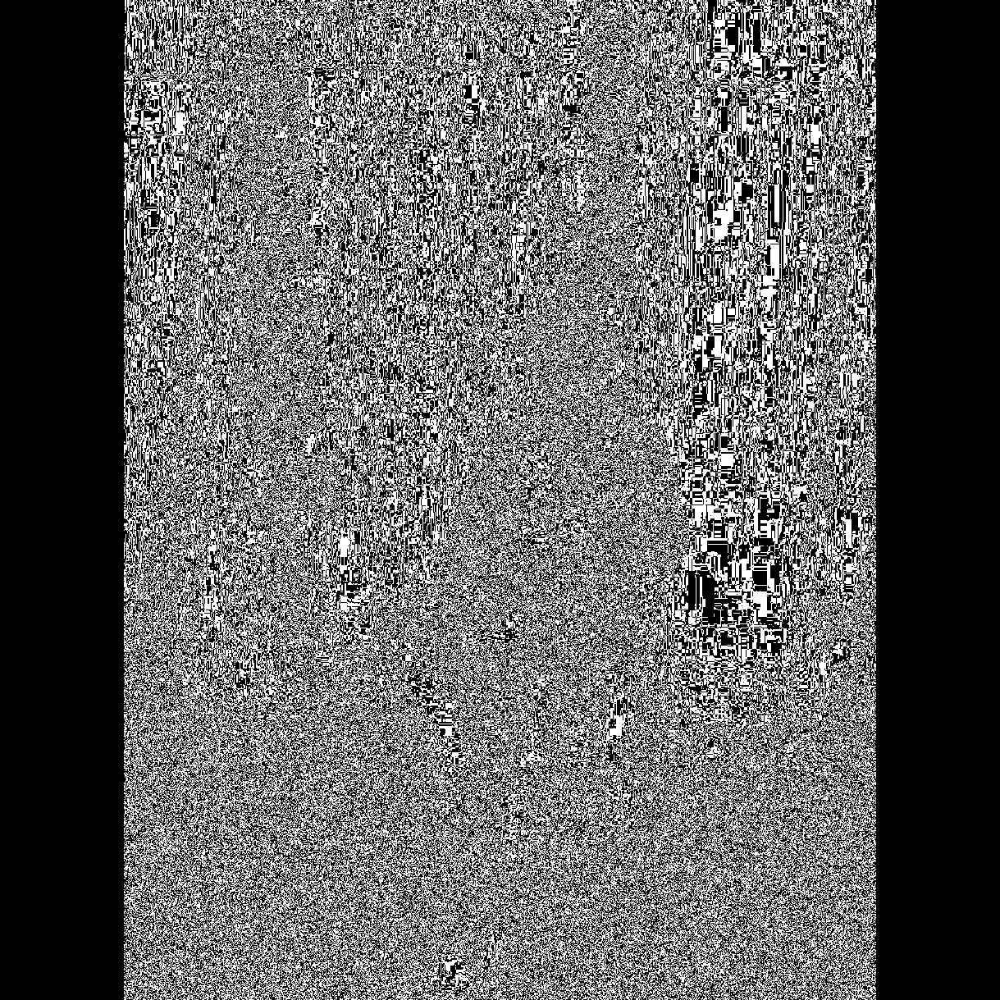

In [232]:
for z in [10000000, 1000000, 100000, 10000, 1000, 100, 10, 1]:
  resultt = np.zeros([1219, 1219])
  for i in range(1219):
    for j in range(1219):
      div = int(result[i][j]/z)
      rem = int(result[i][j]%z)
      resultt[i][j] = div * 255
      result[i][j] = rem
  cv2_imshow(resultt)

# **NEIGHBOR TRANSFORMATIONS**

In [46]:
img2 = cv2.resize(image, (256,256))

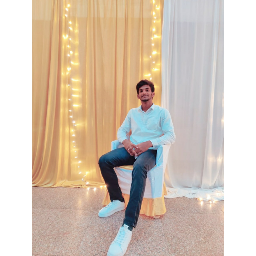

In [47]:
cv2_imshow(img2)

In [48]:
# Make black border
img3 = cv2.copyMakeBorder(img2, 2, 2, 2, 2, cv2.BORDER_CONSTANT, None, value = 0)

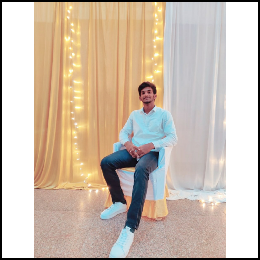

In [49]:
cv2_imshow(img3)

New dimension is 260 X 260

In [50]:
img4 = np.zeros([260,260])

### **Mean neighbor transformations**

In [51]:
for i in range(2,258):
  for j in range(2,258):
    neighbors = []
    # Fetch all neighbours for middle element of a 5x5 matrix
    for k in range(i-2,i+3):
      for l in range(j-2,j+3):
        neighbors.append(img3[k,l])
    max = np.amax(neighbors)
    img4[i,j] = max

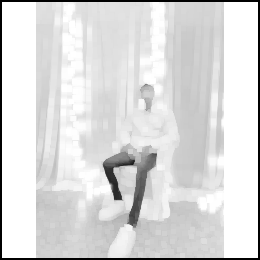

In [52]:
cv2_imshow(img4)

### **Median neighbor transformations**

In [57]:
for i in range(2,258):
  for j in range(2,258):
    neighbors = []
    # Fetch all neighbours for middle element of a 5x5 matrix
    for k in range(i-2,i+3):
      for l in range(j-2,j+3):
        neighbors.append(img3[k,l])
    median = np.median(neighbors)
    img4[i,j] = median

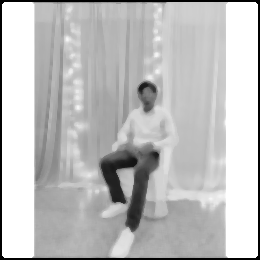

In [58]:
cv2_imshow(img4)

# **OPERATIONS ON SET OF IMAGES**

## **ARITHMETIC OPERATIONS**

In [72]:
img1 = cv2.imread('/content/drive/MyDrive/Hackathon_emotions/Handsome_me.png')
img1 = cv2.resize(img1, (256,256))
r, g, b = img1[:,:,0], img1[:,:,1], img1[:,:,2]
img1 = 0.2989 * r + 0.5870 * g + 0.1140 * b

In [73]:
img2 = cv2.imread('/content/drive/MyDrive/Hackathon_emotions/butterfly.jpg')
img2 = cv2.resize(img2, (256,256))
r, g, b = img2[:,:,0], img2[:,:,1], img2[:,:,2]
img2 = 0.2989 * r + 0.5870 * g + 0.1140 * b

### **Subtraction**

In [74]:
imgg = cv2.subtract(img1,img2)

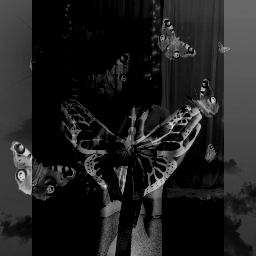

In [75]:
cv2_imshow(imgg)

### **Multiplication**

In [84]:
imgg = cv2.multiply(img2,img2)

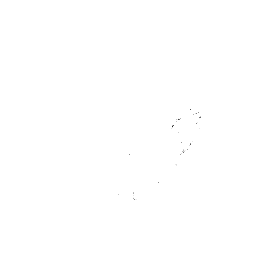

In [85]:
cv2_imshow(imgg)

Here, after multipication, all the pixel values are close to 255, thus most of the image is white in color

## **LOGICAL OPERATIONS**

### **Bitwise AND**

In [95]:
img_and = cv2.bitwise_and(img1, img2, mask = None)

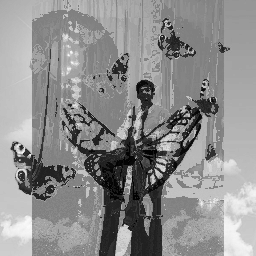

In [96]:
cv2_imshow(img_and)

### **Bitwise OR**

In [93]:
img_or = cv2.bitwise_or(img1, img2, mask = None)

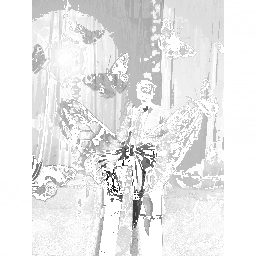

In [94]:
cv2_imshow(img_or)

## **GEOMETRICAL OPERATIONS**

In [107]:
img  = cv2.imread('/content/drive/MyDrive/Hackathon_emotions/Handsome_me.png')

### **Zoom in**

In [128]:
img = cv2.resize(img, (256,256))

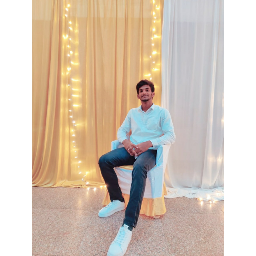

In [129]:
cv2_imshow(img)

In [139]:
part = img[100:200, 100:200]

In [140]:
part = cv2.resize(part, (256,256))

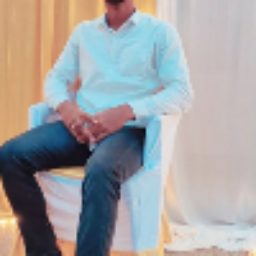

In [141]:
cv2_imshow(part)

### **Translation**

In [142]:
height, width = img.shape[:2]
quarter_height, quarter_width = height / 4, width / 4
T = np.float32([[1, 0, quarter_width], [0, 1, quarter_height]])
img_translation = cv2.warpAffine(image, T, (width, height))

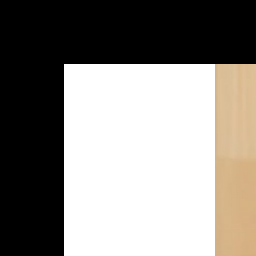

In [143]:
cv2_imshow(img_translation)

## **STASTICAL OPERATIONS**

### **Median**

In [101]:
img = cv2.imread('/content/drive/MyDrive/Hackathon_emotions/Handsome_me.png')

In [103]:
median = np.median(img)

In [104]:
print(median)

199.0


### **Standard deviation**

In [105]:
sd = np.std(img)

In [106]:
print(sd)

50.506454897958115


## **IMAGE INTERPOLATION**

### **Up scaling**

In [144]:
scale_percent = 220 # percent of original size
width = int(img.shape[1] * scale_percent / 100)
height = int(img.shape[0] * scale_percent / 100)
dim = (width, height)
  
# resize image
resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)

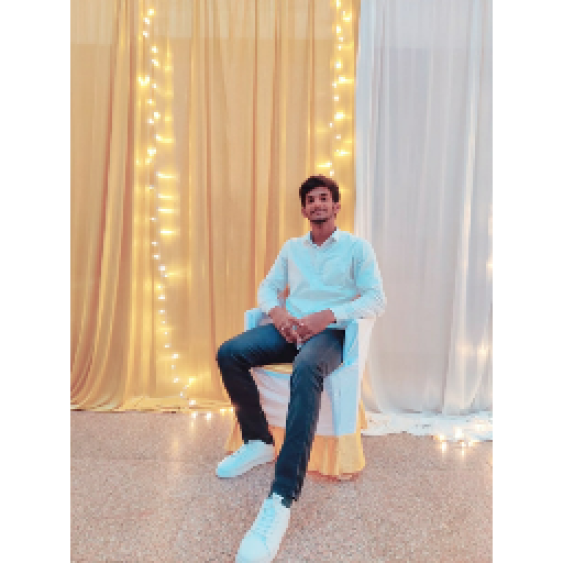

In [145]:
cv2_imshow(resized)